In [6]:
import torch
import clip
from PIL import Image
from utils import *
from tqdm import tqdm
from dataloader_comma import *
import json
from torch.utils.data import DataLoader
import pandas as pd
import torchvision.utils as vutils
import random
from torchvision import datasets, transforms
import os 
import matplotlib.pyplot as plt

In [5]:
#!pip install git+https://github.com/openai/CLIP.git
#!pip install h5py

Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.6/4.6 MB 29.6 MB/s eta 0:00:0000:0100:01


In [ ]:
import torch
from utils import *
import pandas as pd
from tqdm import tqdm
from dataloader_comma import *
import torchvision.utils as vutils
import random
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import os 


device = "cuda:0"
model, preprocess = clip.load("ViT-L/14", device=device)
multitask = "distance"
dataset_type = 'train'
dataset = CommaDataset(dataset_type=dataset_type, multitask=multitask, return_full=True)
loader = DataLoader(dataset, batch_size=1, num_workers=5)
##CHANGE PATHS HERE
save_path = '/data1/shared/jessica/data3/data/toyota/explanation'
dfs = []
text = clip.tokenize(scenarios).to(device)
scenarios_tokens = scenarios_tokens.to(device)
p = '/data3/jessica/data/toyota/explanation_scenarios/explanation_scenarios_filtered/'
feats = []
similarities = []
similarities_labels = []
with torch.no_grad():
    text_features = model.encode_text(scenarios_tokens)
for elem in os.listdir(p): 
    if ".txt" in elem: continue
    # Open the image using PIL
    img = Image.open(p + elem)
    img = torch.from_numpy(np.array(img)).permute(2, 0, 1).float() / 255.0
    img = img.to(device).unsqueeze(0)
    with torch.no_grad():
        image_features = model.encode_image(img)
    
    image_features /= image_features.norm(dim=-1, keepdim=True)
    text_features /= text_features.norm(dim=-1, keepdim=True)
    feats.append(image_features)
    similarity = (100.0 * image_features @ text_features.T).softmax(dim=-1)
    with open((p + elem).replace(".png", ".txt"), 'r') as f:
        # Read the contents of the file as a string
        dict_str = f.read()
    similarities_labels.append(list(eval(dict_str).values()))
    similarities.append(similarity)

In [2]:
feats = torch.concatenate(feats)
stacked = torch.stack([torch.tensor(list(similarities_labels)) for elem in range(240)])


In [ ]:
def get_similarity(image_array, feats, text_features, stacked, intervention):
    with torch.no_grad():
        image_features = model.encode_image(image_array[intervention.squeeze().tolist()])
    image_features /= image_features.norm(dim=-1, keepdim=True)
    text_features /= text_features.norm(dim=-1, keepdim=True)
    img_similarity = (100.0 * image_features @ feats.T).softmax(dim=-1)
    text_similarity = (100.0 * image_features @ text_features.T).softmax(dim=-1)
    img_sim, max_indices = torch.max(img_similarity, dim=1)
    s = stacked[intervention.squeeze().tolist()]
    selected_indices = s[torch.arange(len(s)), max_indices.cpu()].squeeze(dim=1)
    similarities = (1-img_sim).unsqueeze(dim=1).cpu() * text_similarity.cpu() + (img_sim).unsqueeze(dim=1).cpu() * selected_indices.cpu()
    return similarities

In [108]:
top_5_reinstate = []
top_5_intervene_before = []
top_5_intervene_after = []

with torch.no_grad():
    for j, batch in tqdm(enumerate(loader)):
        image_array, vego, angle, distance, gas, brake, ccenabled = batch
        image_array = image_array.squeeze().to(device)
        intervention = ccenabled.squeeze()

        #switch_indices = np.where(np.diff(intervention) == 1)[0] + 1
        intervention_after = get_reduced_sample(ccenabled, reinstate=False, after=True)
        intervention_before = get_reduced_sample(ccenabled, reinstate=False, after=False)
        
        if intervention_before.sum() != 0: 
            img_sim_intervention_before = get_similarity(image_array, feats, text_features, stacked, intervention_before)
            values, indices = img_sim_intervention_before.float().topk(5, dim=1)
            indices, idx = torch.sort(indices,dim=1)
            values, indices = indices.topk(1, dim=0)
            top_5_intervene_before.extend(values.tolist())

            img_sim_intervention_after = get_similarity(image_array, feats, text_features, stacked, intervention_after)
            values, indices = img_sim_intervention_after.float().topk(5, dim=1)
            indices, idx = torch.sort(indices,dim=1)
            values, indices = indices.topk(1, dim=0)
            top_5_intervene_after.extend(values.tolist())

        '''
        #reinstate = get_reduced_sample(ccenabled, reinstate=True)
        # if reinstate.sum() != 0: 
            img_sim_reinstate = get_similarity(image_array, feats, text_features, stacked, reinstate)
            values, indices = img_sim_reinstate.float().topk(5,dim=1)
            top_5_reinstate.extend(indices.tolist())
        #values, indices = similarity[0].topk(5)
        
        
        # Print the result'''
        '''print("\nTop predictions:\n")
        for value, index in zip(values, indices):
            print(f"{scenarios[index]:>16s}: {100 * value.item():.2f}%")
        break'''

247it [01:23,  2.96it/s]


In [112]:
top_5_intervene_after_sq = torch.tensor(top_5_intervene_after).reshape((len(top_5_intervene_after)* len(top_5_intervene_after[1]), 1)).squeeze().tolist()

In [114]:
top_5_intervene_before_sq = torch.tensor(top_5_intervene_before).reshape((len(top_5_intervene_before)* len(top_5_intervene_before[1]), 1)).squeeze().tolist()

In [116]:
df = pd.DataFrame(top_5_intervene_after_sq, columns=["scenario"])
df['scenario'] = df.scenario.apply(lambda x: scenarios[x])
df['c'] = 1
df.groupby("scenario").sum().sort_values(by="c", ascending=False)

,c
scenario,
a picture of cars driving in the distance,63
a picture of cars driving close by,61
a picture of cars driving during the day,58
"a picture of a street with no traffic, there are only few cars",34
a picture of cars driving on a street in sunny weather,23
a picture of cars on a street in cloudy weather,19
a picture of cars driving in the dark,15
a picture of a car which megres into a new street or lane,12
a picture of a street with poor visibility in front,11


In [117]:
df = pd.DataFrame(top_5_intervene_before_sq, columns=["scenario"])
df['scenario'] = df.scenario.apply(lambda x: scenarios[x])
df['c'] = 1
df.groupby("scenario").sum().sort_values(by="c", ascending=False)

,c
scenario,
a picture of cars driving in the distance,64
a picture of cars driving close by,63
a picture of cars driving during the day,54
"a picture of a street with no traffic, there are only few cars",28
a picture of cars on a street in cloudy weather,16
a picture of cars driving in the dark,16
a picture of cars driving on a street in sunny weather,15
a picture of a car close by on the left,15
a picture of a street with poor visibility in front,15


In [78]:
torch.tensor(top_5_intervene).shape

torch.Size([843, 5])

In [83]:
top_5_intervene_sq = torch.tensor(top_5_intervene).reshape((843* 5, 1)).squeeze().tolist()


In [85]:
df_interv = pd.DataFrame(top_5_intervene_sq, columns=["scenario"])
df_interv['scenario'] = df_interv.scenario.apply(lambda x: scenarios[x])
df_interv['c'] = 1
df_interv.groupby("scenario").sum().sort_values(by="c", ascending=False)

,c
scenario,
a picture of cars driving in the distance,820
a picture of cars driving during the day,816
"a picture of a street with no traffic, there are only few cars",672
a picture of cars driving on a street in sunny weather,635
a picture of a street with poor visibility in front,355
a picture of cars driving close by,320
a picture of cars driving in the dark,205
a picture of cars on a street in rain,168
a picture of cars on a street in cloudy weather,51


In [14]:
p = '/data3/jessica/data/toyota/explanation_intervention/'
top3 = []
for elem in os.listdir(p):
    if ".json" not in elem: continue
    with open(p + elem, 'r') as f:
    # Load the data from the file into a Python dictionary:
        data = json.load(f)
    df = pd.DataFrame(list(data.items()), columns=['Text', 'Probability'])
    df["Probability"] = df["Probability"].apply(lambda x: float(x))
    df = df[df["Text"] != "a picture of cars driving during the day"]
    df = df[df["Text"] != "a picture of cars driving in the dark"]
    top3.extend(df.sort_values("Probability", ascending=False)[0:5].Text.tolist())
df = pd.DataFrame(top3)
df['count'] = 1
df.groupby(0).sum().sort_values("count", ascending=False)

In [2]:
p = '/data3/jessica/data/toyota/explanation_reinstate_cc/'
top3 = []
for elem in os.listdir(p):
    if ".json" not in elem: continue
    with open(p + elem, 'r') as f:
    # Load the data from the file into a Python dictionary:
        data = json.load(f)
    df = pd.DataFrame(list(data.items()), columns=['Text', 'Probability'])
    df["Probability"] = df["Probability"].apply(lambda x: float(x))
    df = df[df["Text"] != "a picture of cars driving during the day"]
    df = df[df["Text"] != "a picture of cars driving in the dark"]
    top3.extend(df.sort_values("Probability", ascending=False)[0:5].Text.tolist())
df = pd.DataFrame(top3)
df['count'] = 1
df.groupby(0).sum().sort_values("count", ascending=False)

,count
0,
a picture of cars driving in the distance,141
a picture of cars driving close by,135
a picture of a street with poor visibility in front,124
a picture of cars on a street in rain,74
a picture of cars driving on a street with a lot of traffic,55
a picture of cars waiting at traffic light,53
a picture of a car close by on the left,47
a picture of cars driving in a traffic jam,31
a picture of a car close by on the right,27


In [3]:
p = '/data3/jessica/data/toyota/explanation_intervene_cc/'
top3 = []
for elem in os.listdir(p):
    if ".json" not in elem: continue
    with open(p + elem, 'r') as f:
    # Load the data from the file into a Python dictionary:
        data = json.load(f)
    df = pd.DataFrame(list(data.items()), columns=['Text', 'Probability'])
    df["Probability"] = df["Probability"].apply(lambda x: float(x))
    df = df[df["Text"] != "a picture of cars driving during the day"]
    df = df[df["Text"] != "a picture of cars driving in the dark"]
    top3.extend(df.sort_values("Probability", ascending=False)[0:5].Text.tolist())
df = pd.DataFrame(top3)
df['count'] = 1
df.groupby(0).sum().sort_values("count", ascending=False)

,count
0,
a picture of cars driving in the distance,77
a picture of cars driving close by,71
a picture of a street with poor visibility in front,68
a picture of cars on a street in rain,44
a picture of cars driving on a street with a lot of traffic,28
a picture of cars waiting at traffic light,27
a picture of a car close by on the left,21
a picture of cars driving in a traffic jam,16
a picture of a car close by on the right,13


7it [00:03,  2.21it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
17it [00:06,  2.68it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
22it [00:08,  3.00it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
24it [00:08,  3.76it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
27it [00:10,  2.66it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
32it [00:11,  2.98it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
67it [00:21,  2.64it/s]Clipping input data to the valid range for imshow with RGB data ([0..1

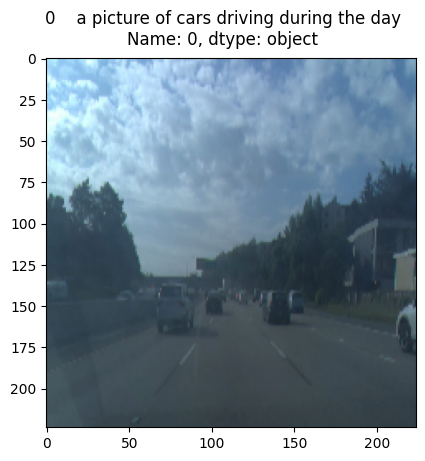

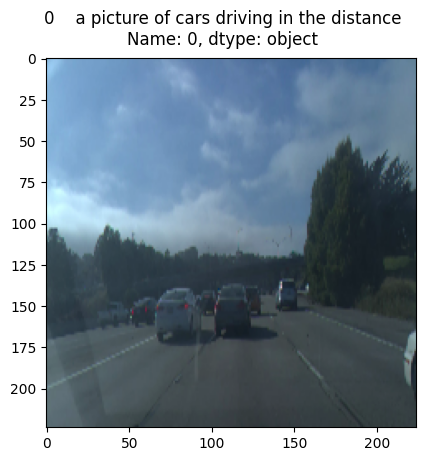

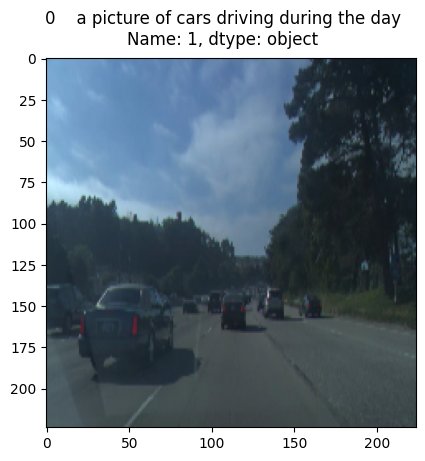

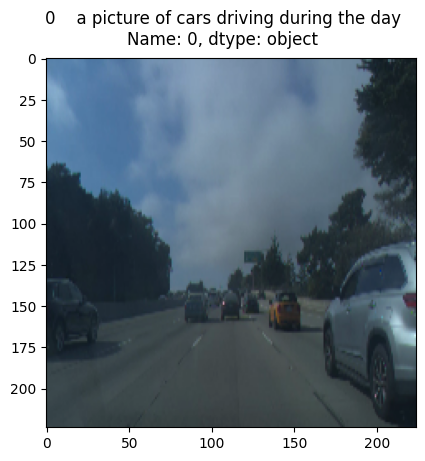

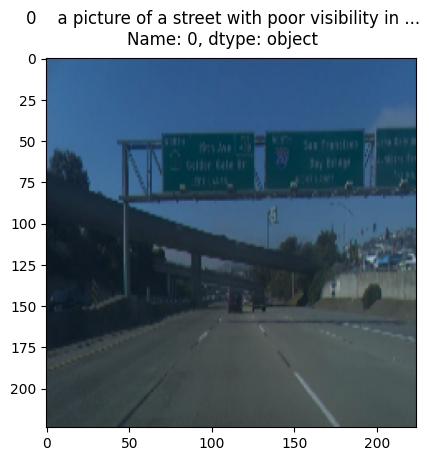

...

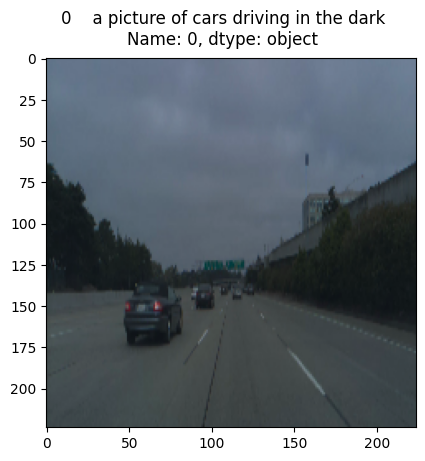

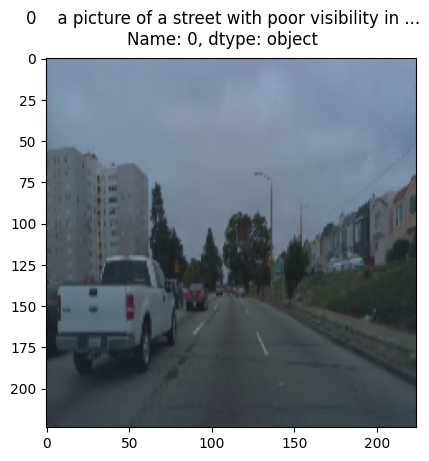

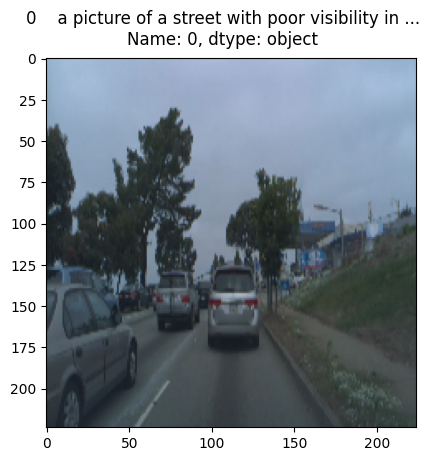

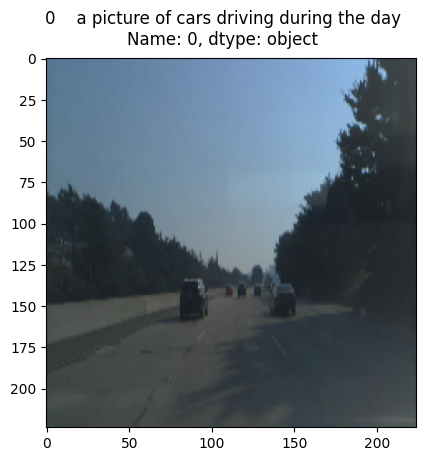

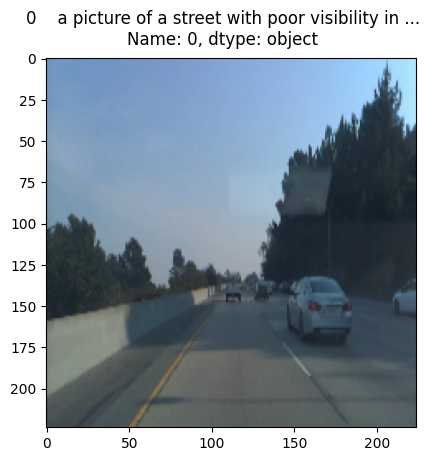

In [5]:
import torch
import clip
from PIL import Image
from utils import *
import pandas as pd
from tqdm import tqdm
from dataloader_comma import *
import json
from torch.utils.data import DataLoader

import matplotlib.pyplot as plt

device = "cuda:0"
model, preprocess = clip.load("ViT-L/14", device=device)
multitask = "distance"
dataset_type = 'train'
dataset = CommaDataset(dataset_type=dataset_type, multitask=multitask, return_full=True)
loader = DataLoader(dataset, batch_size=1, num_workers=5)
save_path = '/data3/jessica/data/toyota/explanation_intervene_cc/'

text = clip.tokenize(scenarios).to(device)
scenarios_tokens = scenarios_tokens.to(device)
with torch.no_grad():
    for j, batch in tqdm(enumerate(loader)):
        image_array, vego, angle, distance, gas, brake, ccenabled = batch
        intervention = ccenabled.squeeze()

        #switch_indices = np.where(np.diff(intervention) == 1)[0] + 1
        switch_indices = np.where(np.diff(intervention.int()) == -1)[0] + 1

        intervention = np.zeros_like(intervention.squeeze(), dtype=bool)
        intervention[switch_indices] = True

        if intervention.sum() == 0: 
            continue
        

        images = image_array.squeeze()[intervention.squeeze().tolist()]
        if images.shape[0] == 0: 
            del image_array, vego, angle, distance, gas, brake
            continue

        
        img = images
        s = img.shape#[batch_size, seq_len, h,w,c]
        logits_per_image, logits_per_text = model(img.to(device), scenarios_tokens.to(device))
        probs = logits_per_image.detach()
        probs = logits_per_image.softmax(dim=-1).cpu().detach()
        df = pd.DataFrame([scenarios[i.item()] for i in probs.argmax(dim=-1)])
        #df.to_csv(f'{save_path}/{j}.csv')
        
        for i, img in enumerate(images):
            fig, ax = plt.subplots()
            ax.imshow(img.permute(1,2,0).int())
            fig.suptitle(str(df.iloc[i]))
            name = save_path + f"{i}_{j}" + "_image.png"
            result_dict = {scenarios[k]: str(probs[i][k].item()) for k in range(len(scenarios))}
            with open(name.replace('_image.png', ".json"), 'w') as f:
                json.dump(result_dict, f)
            fig.savefig(name)
        


In [2]:
import numpy as np

# Generate random boolean array
signal = np.random.randint(0, 2, size=10, dtype=bool)
print("Signal:", signal)

# Find indices where signal switches from 1 to 0
switch_indices = np.where(np.diff(signal.astype(int)) == -1)[0]
print("Switch indices:", switch_indices)

Signal: [ True  True False  True  True False False False False False]
Switch indices: [1 4]
